In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt

from itertools import product
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
data=pd.read_csv("/home/l727r/Desktop/HEREON_2023_COMPUTING/Data/Membrane_Extraction_2023_03_08/membrane_properties.csv")
print(data.shape)
print(data.columns)

(1970, 48)
Index(['file_name', 'mesh__edges__count', 'mesh__edges__mean_length',
       'mesh__edges__std_length', 'mesh__triangles__mean_size',
       'mesh__triangles__std_size', 'mesh__triangles__mean_regularity',
       'mesh__triangles__std_regularity', 'all_pores__area__covered',
       'all_pores__instances__count', 'all_pores__instances__mean_size',
       'all_pores__instances__std_size', 'all_pores__instances__mean_diameter',
       'all_pores__instances__std_diameter',
       'all_pores__instances__mean_circularity',
       'all_pores__instances__std_circularity', 'open_pores__area__covered',
       'open_pores__instances__count', 'open_pores__instances__mean_size',
       'open_pores__instances__std_size',
       'open_pores__instances__mean_diameter',
       'open_pores__instances__std_diameter',
       'open_pores__instances__mean_circularity',
       'open_pores__instances__std_circularity', 'closed_pores__area__covered',
       'closed_pores__instances__count', 'closed_

In [13]:
# df_temp=data[data['artifact_blob__pixel__count']>0]
# print(len(df_temp["file_name"]))
#
# df_temp=df_temp[df_temp['internal_structure__pixel__count']>0]
# print(len(df_temp["file_name"]))
#
# df_temp=df_temp[df_temp['artifact_dust__pixel__count']>0]
# print(len(df_temp["file_name"]))
#
# df_temp=df_temp[df_temp['open_pores__pixel__count']>0]
# print(len(df_temp["file_name"]))
df_temp=ddata
df_temp=df_temp[df_temp['closed_pores__pixel__count']>0]
print(len(df_temp["file_name"]))
for x in df_temp["file_name"]:
    print(f"'{x}'")

NameError: name 'df_temp' is not defined

In [57]:
props=["all_pores__instances__mean_size","all_pores__instances__mean_circularity","mesh__triangles__mean_regularity","mesh__edges__mean_length"]

In [4]:
print(f"Open Pore Size mean mean: {data['open_pores__instances__mean_size'].mean()}")
print(f"Open Pore Size mean std: {data['open_pores__instances__std_size'].mean()}")

print(f"Open Pore Diameter mean mean: {data['open_pores__instances__mean_diameter'].mean()}")
print(f"Open Pore Diameter mean std: {data['open_pores__instances__std_diameter'].mean()}")

print(f"Open Pore Circularity mean mean: {data['open_pores__instances__mean_circularity'].mean()}")
print(f"Open Pore Circularity mean std: {data['open_pores__instances__std_circularity'].mean()}")

print(f"Mesh Triangle regularity mean mean: {data['mesh__triangles__mean_regularity'].mean()} (+-{data['mesh__triangles__mean_regularity'].std()})")
print(f"Mesh Triangle regularity mean std: {data['mesh__triangles__std_regularity'].mean()}")

Open Pore Size mean mean: 1073.0270708850883
Open Pore Size mean std: 363.11874540159636
Open Pore Diameter mean mean: 30.795028779212196
Open Pore Diameter mean std: 5.5183975710621915
Open Pore Circularity mean mean: 0.7977112535489985
Open Pore Circularity mean std: 0.1098279830275169
Mesh Triangle regularity mean mean: 0.7917302126822475 (+-0.12668914420797533)
Mesh Triangle regularity mean std: 0.11325203548228097


In [5]:
def get_outliers(df,prop):
    q1=df[prop].quantile(q=0.25)
    q3=df[prop].quantile(q=0.75)
    iqr = q3 - q1
    upper = q3 + 1.5*iqr
    lower = q1 - 1.5*iqr
    
    out=df.loc[(df[prop] > upper) | (df[prop] < lower) ]
    #out=out.loc[out[prop] < lower ]
    return out

In [6]:
for col in data.columns:
    if col in ['Unnamed: 0', 'file_name']:
        continue
    print(f"{col.ljust(40)} mean:{data[col].mean():.3f}    std:{data[col].std():.3f}      outliers:{len(get_outliers(data,col))}")

mesh__edges__count                       mean:2645.831    std:1400.901      outliers:19
mesh__edges__mean_length                 mean:82.492    std:60.693      outliers:142
mesh__edges__std_length                  mean:25.141    std:47.427      outliers:205
mesh__triangles__mean_size               mean:3694.860    std:9404.870      outliers:150
mesh__triangles__std_size                mean:2353.513    std:8559.083      outliers:260
mesh__triangles__mean_regularity         mean:0.792    std:0.127      outliers:16
mesh__triangles__std_regularity          mean:0.113    std:0.044      outliers:1
all_pores__area__covered                 mean:792014.469    std:437829.518      outliers:0
all_pores__instances__count              mean:920.165    std:478.865      outliers:19
all_pores__instances__mean_size          mean:1055.418    std:827.113      outliers:151
all_pores__instances__std_size           mean:367.431    std:618.387      outliers:72
all_pores__instances__mean_diameter      mean:30.3

# Functions

In [7]:
def box_histo_plot(data,props):
    #props=data.columns
    plot_titles=[]
    for p in props:
        plot_titles.append(p)
        plot_titles.append("")

    fig = make_subplots(rows=len(props), cols=2,subplot_titles =plot_titles)
    for i,p1 in enumerate(props):
        #fig.add_trace(go.Box(x=data[p1],name="",boxpoints=False),row=i+1,col=2)
        fig.add_trace(go.Box(x=data[p1],name=""),row=i+1,col=2)
        fig.add_trace(go.Histogram(histfunc="count", x=data[p1],name=p1),row=i+1,col=1)
    fig.update_layout( height=300*len(props),width=1200,showlegend=False,template="plotly_white")

    fig.update_xaxes(rangemode="tozero")
    fig.update_yaxes(rangemode="tozero")

    fig.show()
    

In [8]:
def vio_plot(data,props):
    plot_titles=[]
    for p in props:
        plot_titles.append(p)
        plot_titles.append("")

    fig = make_subplots(rows=2, cols=1,subplot_titles =plot_titles)
    for i,p1 in enumerate(props):
        #fig.add_trace(go.Box(x=data[p1],name="",boxpoints=False),row=i+1,col=2)
        fig.add_trace(go.Violin(x=data[p1],box_visible=True,name=""),row=i+1,col=1)
        #fig.add_trace(go.Histogram(histfunc="count", x=data[p1],name=p1),row=i+1,col=1)
    fig.update_layout( height=600*len(props),width=600,showlegend=False,template="plotly_white")

    fig.update_xaxes(rangemode="tozero")
    fig.update_yaxes(rangemode="tozero")

    fig.show()

In [9]:
def box_histo_plot_com(data,prop):
    #props=data.columns
    plot_titles=[]
    for p in props:
        plot_titles.append(p)
        plot_titles.append("")

    fig = make_subplots(rows=2, cols=1,shared_xaxes=True,vertical_spacing=0,column_titles=[prop],row_titles=["Count",""])
    #cedeeb
    #0059a0
    #e1462c
    #5f3893
    fig.add_trace(go.Box(x=data[prop],name="",marker_color='#e1462c'),row=2,col=1)
    fig.add_trace(go.Histogram(histfunc="count", x=data[prop],marker_color='#0059a0'),row=1,col=1)
                                                        
                                                        
    fig.update_layout( height=600,width=1800,showlegend=False,template="plotly_white")
    
    for anno in fig['layout']['annotations']:
        anno['font']= {'size': 18}
        if anno['textangle']:
            anno['textangle']=-90
            anno['x']=-0.05
        # else:
        #     anno['y']=-0.1
    
    fig.update_xaxes(rangemode="tozero")
    fig.update_yaxes(rangemode="tozero")

    fig.show()

In [10]:
box_histo_plot_com(data, prop)

NameError: name 'prop' is not defined

In [62]:
def grid_plot(data,props,text_size=8,plot_size=150):
   # props=["all_pores__instances__mean_size","all_pores__instances__mean_circularity","mesh__triangles__mean_regularity","mesh__edges__mean_length"]
    #props_n=["pores_mean_size","pores_mean_circularity","triangles_mean_regularity","edges__mean_length"]
    fig = make_subplots(rows=len(props), cols=len(props),shared_xaxes=True,vertical_spacing=0.02,column_titles=props,row_titles=props)
    for i,(p1,p2) in enumerate(product(props,props)):
        i_row=i%len(props)+1
        i_col=i//len(props)+1
        if p1==p2:
            fig.add_trace(go.Histogram(histfunc="count", x=data[p1]),row=i_row,col=i_col)
        else:
            fig.add_trace(go.Scatter(x=data[p1],y=data[p2],mode='markers',marker=dict(opacity=0.2)),row=i_row,col=i_col) # hover text goes here
    fig.update_layout( height=plot_size*len(props),width=plot_size*len(props),showlegend=False,template="plotly_white")

    #fig.for_each_annotation(lambda a: a.update(x = -0.07) if a.text in props else())
    for anno in fig['layout']['annotations']:
        anno['font']= {'size': text_size}
        if anno['textangle']:
            anno['textangle']=-90
            anno['x']=-0.05
    fig.update_xaxes(rangemode="tozero")
    fig.update_yaxes(rangemode="tozero")

    fig.show()

# Class Distribution

In [11]:
class_count={"covered_area":data["covered_area__instances__count"].astype(bool).sum(axis=0),
             "open_pores":data["open_pores__instances__count"].astype(bool).sum(axis=0),
             "closed_pores":data["closed_pores__instances__count"].astype(bool).sum(axis=0),
             "internal_structure":data["internal_structure__instances__count"].astype(bool).sum(axis=0),
             "artifact_blob":data["artifact_blob__instances__count"].astype(bool).sum(axis=0),
             "artifact_dust":data["artifact_dust__instances__count"].astype(bool).sum(axis=0),
            }     
class_count

{'covered_area': 884,
 'open_pores': 1964,
 'closed_pores': 1542,
 'internal_structure': 1429,
 'artifact_blob': 239,
 'artifact_dust': 112}

In [12]:
keys=list(class_count.keys())
vals=[int(class_count[k]) for k in keys]

fig = go.Figure(layout = dict(title='Class Distribution',width=1400, height=700, font=dict(size=18),xaxis=dict(title="Class"),yaxis=dict(title="Occurence"),template="plotly_white"))
fig.add_trace(go.Bar( x=keys, y=vals, text=vals,textposition='auto',marker_color='#0059a0'))

fig.show()

# Parameter Distribution

In [17]:
mesh_props=[
       'mesh__edges__count',
       'mesh__edges__mean_length',
       'mesh__edges__std_length', 
       'mesh__triangles__mean_size',
       'mesh__triangles__std_size', 
       'mesh__triangles__mean_regularity',
       'mesh__triangles__std_regularity']

all_pores_props=['all_pores__area__covered',
       'all_pores__instances__count',
       'all_pores__instances__mean_size', 
       'all_pores__instances__std_size',
       'all_pores__instances__mean_diameter',
       'all_pores__instances__std_diameter',
       'all_pores__instances__mean_circularity',
       'all_pores__instances__std_circularity']

open_pores_props=[ 'open_pores__area__covered', 
       'open_pores__instances__count',
       'open_pores__instances__mean_size', 
       'open_pores__instances__std_size',
       'open_pores__instances__mean_diameter',
       'open_pores__instances__std_diameter',
       'open_pores__instances__mean_circularity',
       'open_pores__instances__std_circularity']

closed_pores_props=['closed_pores__area__covered', 
       'closed_pores__instances__count',
       'closed_pores__instances__mean_size',
       'closed_pores__instances__std_size',
       'closed_pores__instances__mean_diameter',
       'closed_pores__instances__std_diameter',
       'closed_pores__instances__mean_circularity',
       'closed_pores__instances__std_circularity']

other_class_props=['covered_area__area__covered', 
        'covered_area__instances__count', 
        'internal_structure__area_covered',
        'internal_structure__instances__count',
        'artifact_blob__area_covered', 
        'artifact_blob__instances__count', 
        'artifact_dust__pixel__count', 
        'artifact_dust__instances__count']

props_relation=[
'mesh__triangles__mean_regularity',
'mesh__edges__mean_length',  
'open_pores__instances__count',
'open_pores__instances__mean_size', 
'open_pores__instances__mean_circularity',
]
props_relation_2=[
'mesh__triangles__mean_regularity',
'mesh__edges__std_length',  
'open_pores__instances__count',
'open_pores__instances__std_size', 
'open_pores__instances__mean_circularity',
]

# Stuff

In [66]:
def get_largest(df,prop,n):
    files=df.nlargest(5,prop)['file_name']
    props=df.nlargest(5,prop)[prop]
    
    print(f"--Largest {n} files--")
    for f,p in zip(files,props):
        print(f"{p:.4f} - {f}")
    
def get_lowest(df,prop,n):
    files=df.nsmallest(5,prop)['file_name']
    props=df.nsmallest(5,prop)[prop]
    
    print(f"--Smallest {n} files--")
    for f,p in zip(files,props):
        print(f"{p:.4f} - {f}")    

    
    
def get_largest_upper(df,prop,n):
    q1=df[prop].quantile(q=0.25)
    q3=df[prop].quantile(q=0.75)
    iqr = q3 - q1
    upper = q3 + 1.5*iqr
    lower = q1 - 1.5*iqr
    
    df=df[df[prop]<=upper]
    
    files=df.nlargest(5,prop)['file_name']
    props=df.nlargest(5,prop)[prop]
    
    print(f"--Largest Upper {n} files--")
    for f,p in zip(files,props):
        print(f"{p:.4f} - {f}")

def get_lowest_lower(df,prop,n):
    q1=df[prop].quantile(q=0.25)
    q3=df[prop].quantile(q=0.75)
    iqr = q3 - q1
    upper = q3 + 1.5*iqr
    lower = q1 - 1.5*iqr
    
    df=df[df[prop]>=lower]
    
    files=df.nsmallest(5,prop)['file_name']
    props=df.nsmallest(5,prop)[prop]
    
    print(f"--Smallest Lower {n} files--")
    for f,p in zip(files,props):
        print(f"{p:.4f} - {f}")  


def get_median(df,prop,n=5):
    print("Median")
    df=df.sort_values(prop,ascending=False)
    num=len(df)//2
    
    files=df.iloc[num-2:num+3]['file_name']
    props=df.iloc[num-2:num+3][prop]
    
    print(f"--Median {n} files--")
    for f,p in zip(files,props):
        print(f"{p:.4f} - {f}")  
    #print(df[prop].head())
    #df=df[df[prop]==df[prop].median()]
    #print(df["file_name"],df[prop])
        

In [48]:
prop="mesh__triangles__mean_regularity"
get_median(data,prop,5)

Median
--Median 5 files--
0.8565 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No7_048_0000.png
0.8564 - S18044_SVP19-154_recycle_7_26.5_6-4_S10s_Hand_007_0000.png
0.8564 - S19090_SVP24_238k_16wt_THF_DMF_4_6_S5s_Machine_005_0000.png
0.8562 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No9_010_0000.png
0.8562 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No7_034_0000.png


--Largest 5 files--
0.9336 - S17014_PS75P4VP25_100k_5s_012_0000.png
0.9335 - S20101_PVBCB79P4VP21-86K-2cm-4h-100-290nm_005_0000.png
0.9324 - S17035_PS75-P4VP25_100k_7s_50DMF-50THF_004_0000.png
0.9321 - S19061_PVBCB79P4VP21_86K_10s_200m_003_0000.png
0.9294 - S20133_PS76P4VP24_98k_26wt_10s_003_0000.png
--Smallest 5 files--
0.3056 - S18049_PS78P4VP22_98k_26_23s_003_0000.png
0.3058 - S20133_PS76P4VP24_98k_24wt_15s_010_0000.png
0.3344 - S20133_PS76P4VP24_98k_26wt_20s_003_0000.png
0.3528 - S20133_PS76P4VP24_98k_25wt_30s_003_0000.png
0.3547 - S20133_PS76P4VP24_98k_24wt_30s_001_0000.png
--Largest Upper 5 files--
0.9336 - S17014_PS75P4VP25_100k_5s_012_0000.png
0.9335 - S20101_PVBCB79P4VP21-86K-2cm-4h-100-290nm_005_0000.png
0.9324 - S17035_PS75-P4VP25_100k_7s_50DMF-50THF_004_0000.png
0.9321 - S19061_PVBCB79P4VP21_86K_10s_200m_003_0000.png
0.9294 - S20133_PS76P4VP24_98k_26wt_10s_003_0000.png
--Smallest Lower 5 files--
0.4475 - S20133_PS76P4VP24_98k_26wt_20s_001_0000.png
0.4531 - S20056_PVBCB81P4V

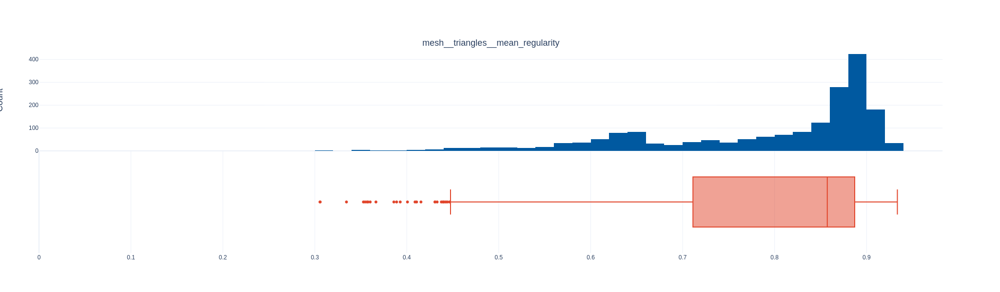

In [232]:
prop="mesh__triangles__mean_regularity"
get_largest(data,prop,5)
get_lowest(data,prop,5)
get_largest_upper(data,prop,5)
get_lowest_lower(data,prop,5)
get_median(data,prop)
box_histo_plot_com(data, prop)

--Largest 5 files--
547.7516 - S19121_PS88P4VP18_150k_24-3D_7TRT_20s_004_0000.png
543.4995 - S19132_PS88P4VP18_150k_28-D_TRT_20s_006_0000.png
542.9211 - S20132_PS80P4VP20_182k_22wt_10s_004_0000.png
533.2851 - S17155_PS75P4VP25_100k_27_15s_50DMF_50THF_002_0000.png
509.4237 - S19131_PS88P4VP18_150k_18-D_T4500_20s_007_0000.png
--Smallest 5 files--
2.0734 - S18161_PS81.8P4VP18.2_188k_25_THF_DMF_4_6_G15s_001_0000.png
3.0270 - S18161_PS81.8P4VP18.2_188k_25_THF_DMF_4_6_G10s_001_0000.png
4.3563 - S19050_PS82P4VP18_191k_22_THF_DMF_35_65_S10s_002_0000.png
6.1606 - S18143_PVBCB83P4VP17_185K-5s_sol-c_003_0000.png
7.5158 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_013_0000.png
--Largest Upper 5 files--
143.2127 - S19124_SVP24_238k_18wt_THF_DMF_4_6_S5s_Machine_No.1_016_0000.png
142.3757 - S21131_PS76P4VP24_238k_18wt_THF_DMF_4_6_No8_020_0000.png
142.0023 - S19090_SVP24_261k_16wt_THF_DMF_4_6_S15s_Machine_003_0000.png
141.7363 - S19124_SVP24_238k_18wt_THF_DMF_4_6_S5s_Machine_No.1_005_0000.png
141.

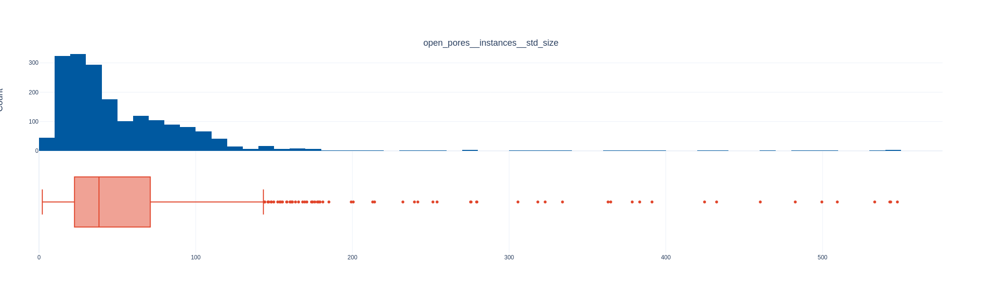

In [247]:
prop="open_pores__instances__std_size"

data_x=data[data["open_pores__instances__count"]>3]
data_x=data_x[data_x["open_pores__instances__std_size"]<600]

get_largest(data_x,prop,5)
get_lowest(data_x,prop,5)
get_largest_upper(data_x,prop,5)
get_lowest_lower(data_x,prop,5)
get_median(data_x,prop)

box_histo_plot_com(data_x, prop)

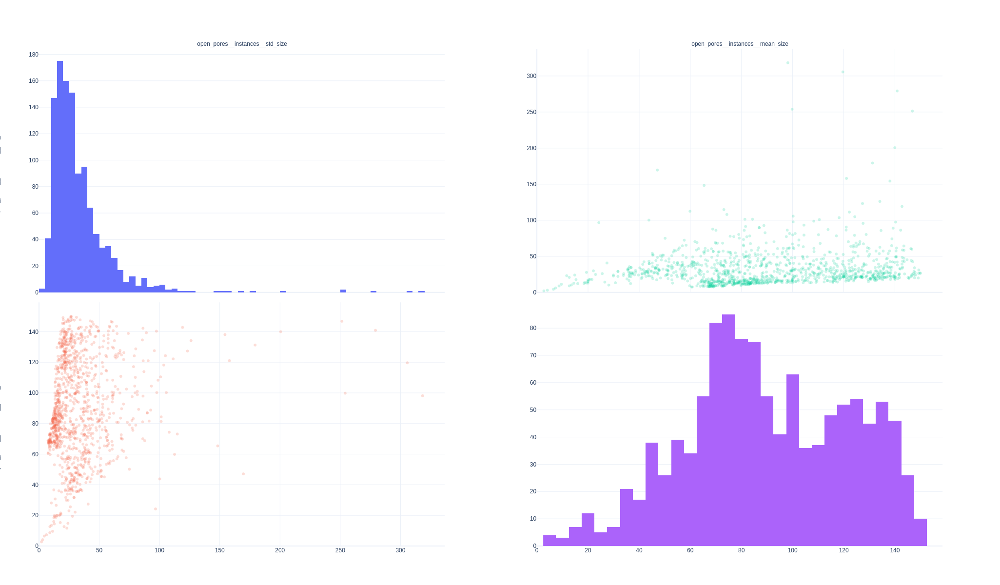

In [260]:
data_x=data[data["open_pores__instances__count"]>10]
data_x=data_x[data_x["open_pores__instances__mean_size"]<300]
data_x=data_x[data_x["open_pores__instances__mean_size"]<150]
grid_plot(data_x,["open_pores__instances__std_size","open_pores__instances__mean_size"],text_size=12,plot_size=600)

--Largest 5 files--
2218.0000 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_002_0000.png
2202.0000 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.2_004_0000.png
2193.0000 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_009_0000.png
2181.0000 - S19042_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.3_018_0000.png
2179.0000 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_011_0000.png
--Smallest 5 files--
0.0000 - S17119_PS75P4VP25_100k_30s_50DMF_50THF_001_0000.png
0.0000 - S17169_PS75P4VP25_100k_7s_50DMF_50THF_001_0000.png
0.0000 - S17169_PS75P4VP25_100k_7s_50DMF_50THF_002_0000.png
0.0000 - S17233_30GM125_D_T_2500_7s_004_0000.png
0.0000 - S17238_PS86.5P4VP13.5_82.8k_25_D_T_1500_2s_004_0000.png
--Largest Upper 5 files--
2010.0000 - S19015_PS17P4VP78_100k_32_THF_DMF_1_1_S10s_001_0000.png
2008.0000 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.2_026_0000.png
2005.0000 - S18038_SVP18-110_recycle_DMF-THF_4-6_29_G5s_001_0000.png
1988.0000 - S19042_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.3_021_0000.p

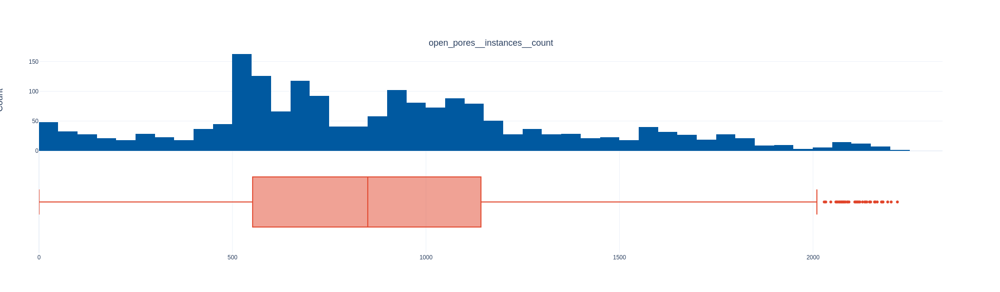

In [238]:
prop="open_pores__instances__count"
get_largest(data,prop,5)
get_lowest(data,prop,5)
get_largest_upper(data,prop,5)
get_lowest_lower(data,prop,5)
get_median(data,prop)
box_histo_plot_com(data, prop)

--Largest 5 files--
184.3095 - S20057_PVBCB-co-S81P4VP19-159K-5s-100um-22wt_007_0000.png
179.0564 - S20133_PS76P4VP24_98k_24wt_15s_010_0000.png
165.6236 - S17107_PS83,2P4VP16,8_113k_5s_50DMF_50THF_001_0000.png
162.0979 - S18049_PS78P4VP22_98k_26_23s_003_0000.png
160.0601 - S20132_PS80P4VP20_182k_24wt__35s_001_0000.png
--Smallest 5 files--
1.0108 - S19042_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.3_027_0000.png
1.0503 - S20101_PVBCB79P4VP21-86K-2cm-4h-100-290nm_005_0000.png
1.0774 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_013_0000.png
1.0827 - S18060_PS78P4VP22_97k_26_13s_008_0000.png
1.1337 - S19016_PS83P4VP17_100k_32_THF_DMF_5_5_S5s_No.1_011_0000.png
--Largest Upper 5 files--
19.8299 - S19050_PS74P4VP26_166k_19_THF_DMF_DOX_3_4_3_S10s_005_0000.png
19.5387 - S19121_PS88P4VP18_150k_24-3D_7TRT_20s_004_0000.png
19.5062 - S20134_PS80P4VP20_182k_22wt_20s_003_0000.png
19.4088 - S19108_PS80.5_P4VP19.5_123k_28Wt,40THF_60DMF_5sec_004_0000.png
19.3384 - S19135_PS88P4VP18_150k_24-3D_7T1500_10s_

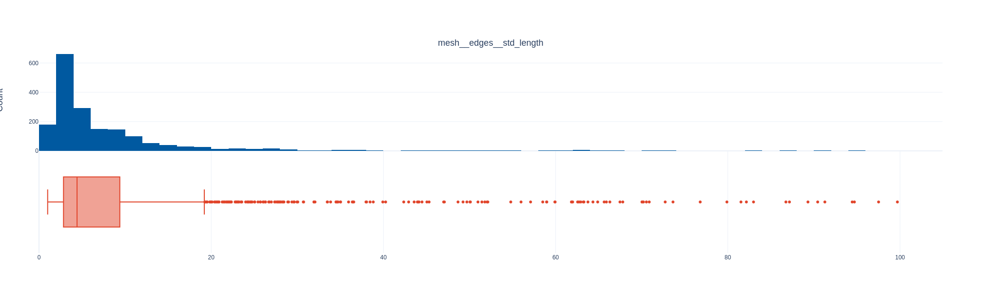

In [255]:
prop="mesh__edges__std_length"
data_x=data[data["open_pores__instances__count"]>5]
data_x=data_x[data_x["mesh__edges__std_length"]<100]
get_largest(data,prop,5)
get_lowest(data,prop,5)
get_largest_upper(data,prop,5)
get_lowest_lower(data,prop,5)
get_median(data,prop)
box_histo_plot_com(data_x, prop)

--Largest 5 files--
0.9258 - S17035_PS80-P4VP20_94k_30s_60DMF-40THF_001_0000.png
0.9148 - S20076_PVBCB79P4VP21-86K-2cm-4h-100-280nm_004_0000.png
0.9131 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No5_038_0000.png
0.9111 - S20076_PVBCB79P4VP21-86K-2cm-4h-100-280nm_005_0000.png
0.9057 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No5_040_0000.png
--Smallest 5 files--
0.0000 - S17205_PS81P4VP19-154k_27_THF_DMF_6_4_G_10s_004_0000.png
0.2663 - S18161_PS81.8P4VP18.2_188k_25_THF_DMF_4_6_G15s_001_0000.png
0.3467 - S17155_PS75P4VP25_100k_25_25s_40DMF_60THF_002_0000.png
0.3508 - S18161_PS81.8P4VP18.2_188k_25_THF_DMF_4_6_G10s_001_0000.png
0.3561 - S18161_PS81.8P4VP18.2_188k_25_THF_DMF_4_6_G5s_001_0000.png
--Largest Upper 5 files--
0.9258 - S17035_PS80-P4VP20_94k_30s_60DMF-40THF_001_0000.png
0.9148 - S20076_PVBCB79P4VP21-86K-2cm-4h-100-280nm_004_0000.png
0.9131 - S20067_PS74P4VP26_166k_19wt_THF_DMF_DOX_3_4_3_No5_038_0000.png
0.9111 - S20076_PVBCB79P4VP21-86K-2cm-4h-100-280nm_005_0000.png
0.9

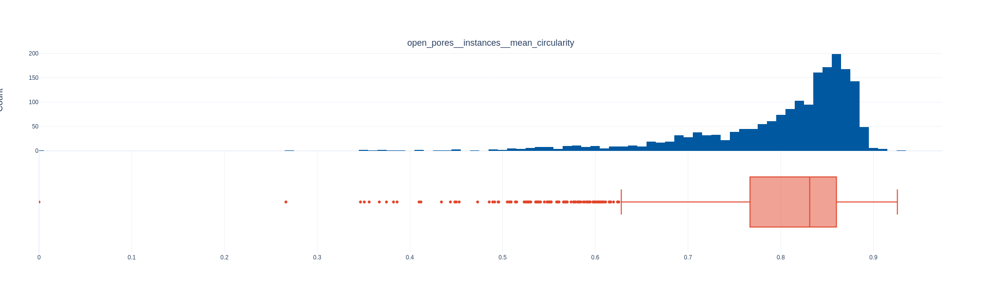

In [256]:
prop="open_pores__instances__mean_circularity"
get_largest(data,prop,5)
get_lowest(data,prop,5)
get_largest_upper(data,prop,5)
get_lowest_lower(data,prop,5)
get_median(data,prop)
box_histo_plot_com(data, prop)

## Mesh Properties

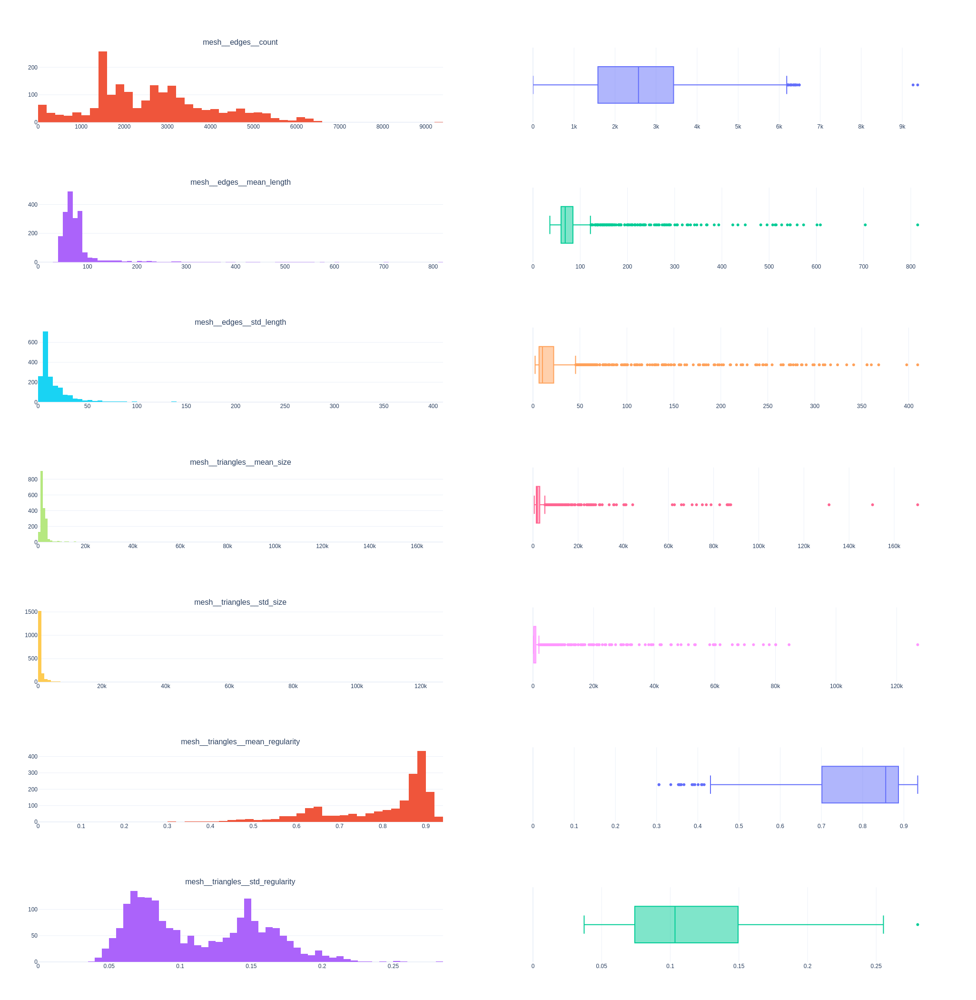

In [12]:
box_histo_plot(data, mesh_props)

## All Pores

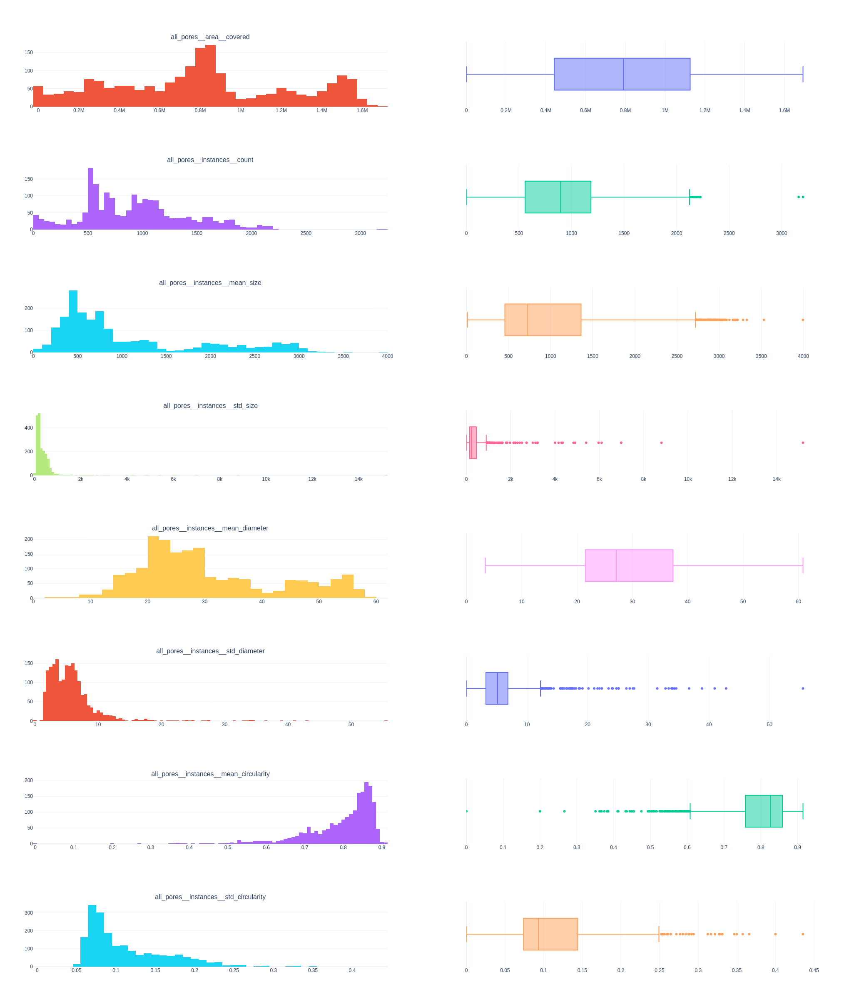

In [18]:
box_histo_plot(data, all_pores_props)

## Open Pores

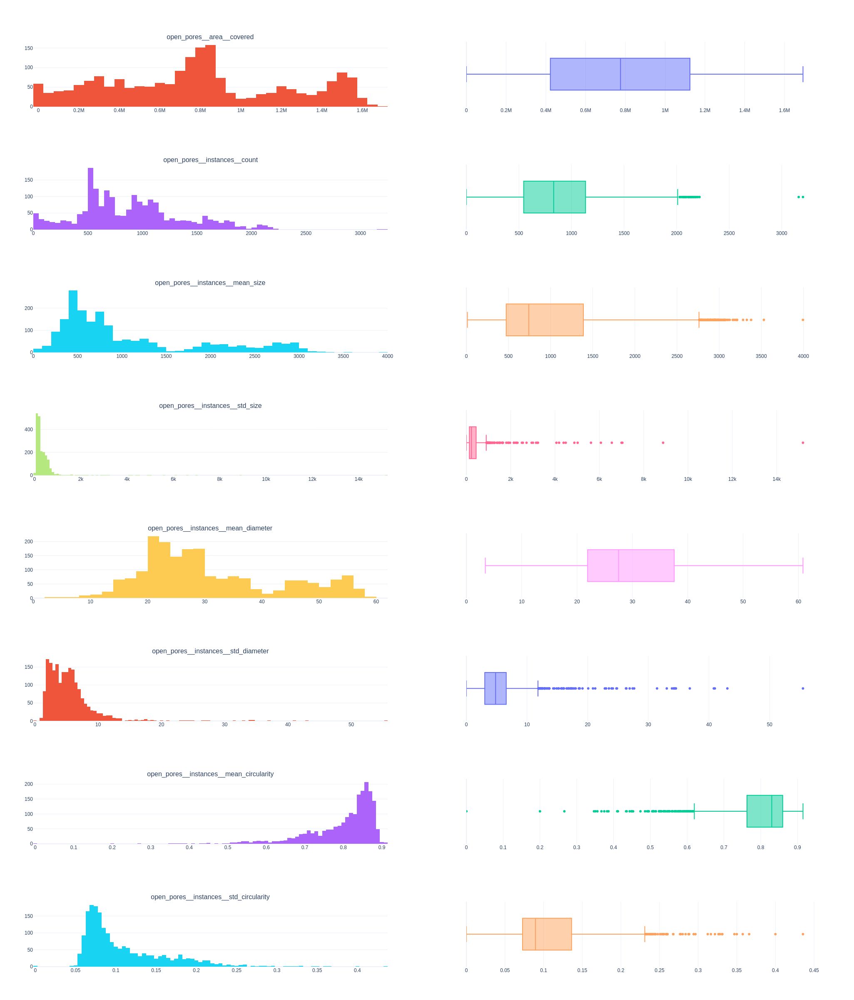

In [19]:
box_histo_plot(data, open_pores_props)

## Closed Pores

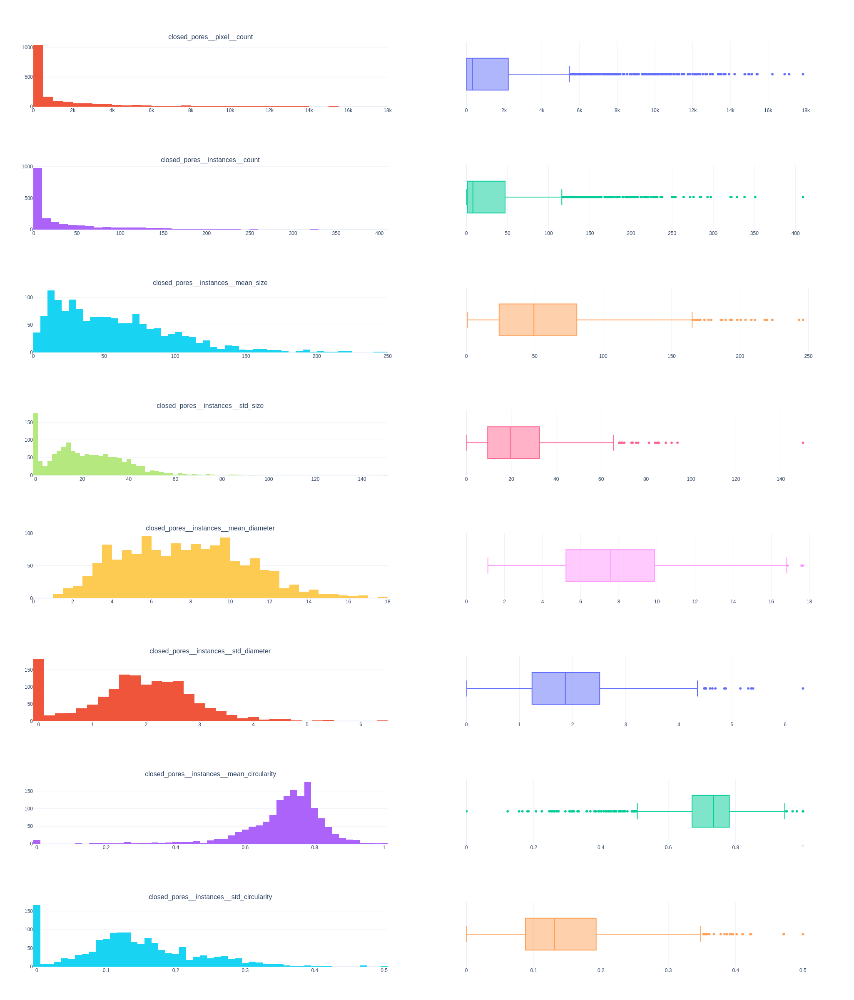

In [71]:
box_histo_plot(data, closed_pores_props)

## Other Classes

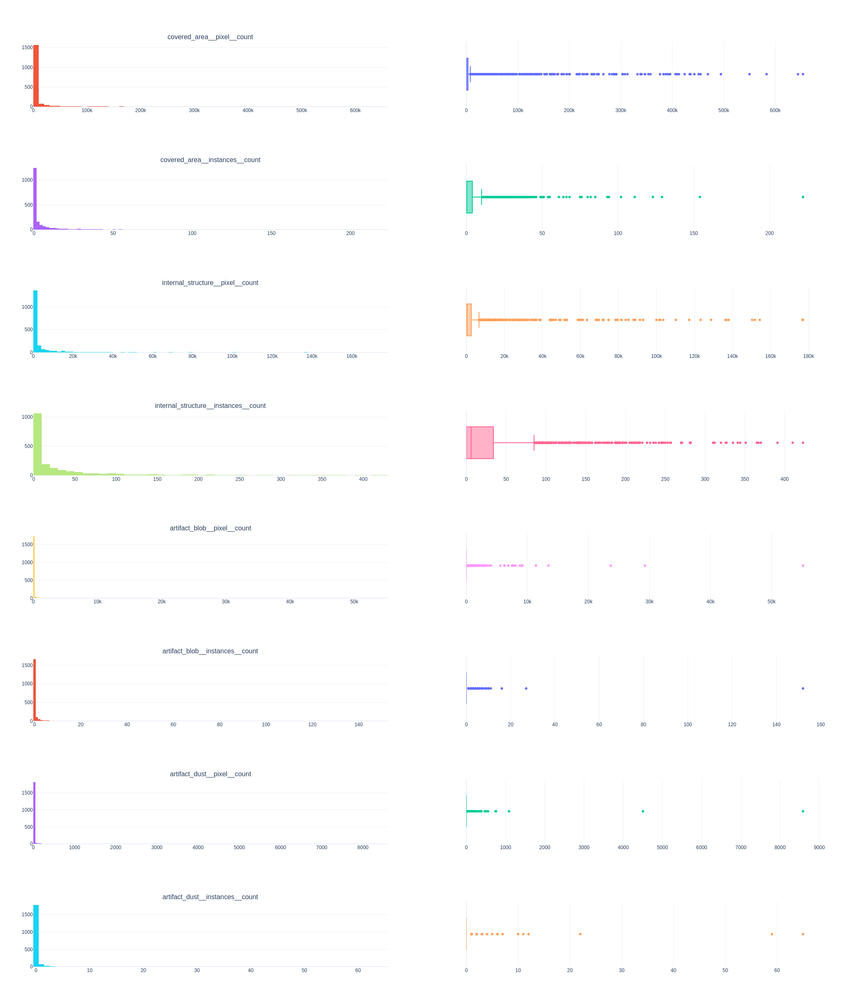

In [72]:
box_histo_plot(data, other_class_props)

# Parameter Relation

In [78]:
#grid_plot(data, mesh_props)

In [79]:
#grid_plot(data,closed_pores_props)

In [80]:
#grid_plot(data,props_relation,text_size=12,plot_size=300)

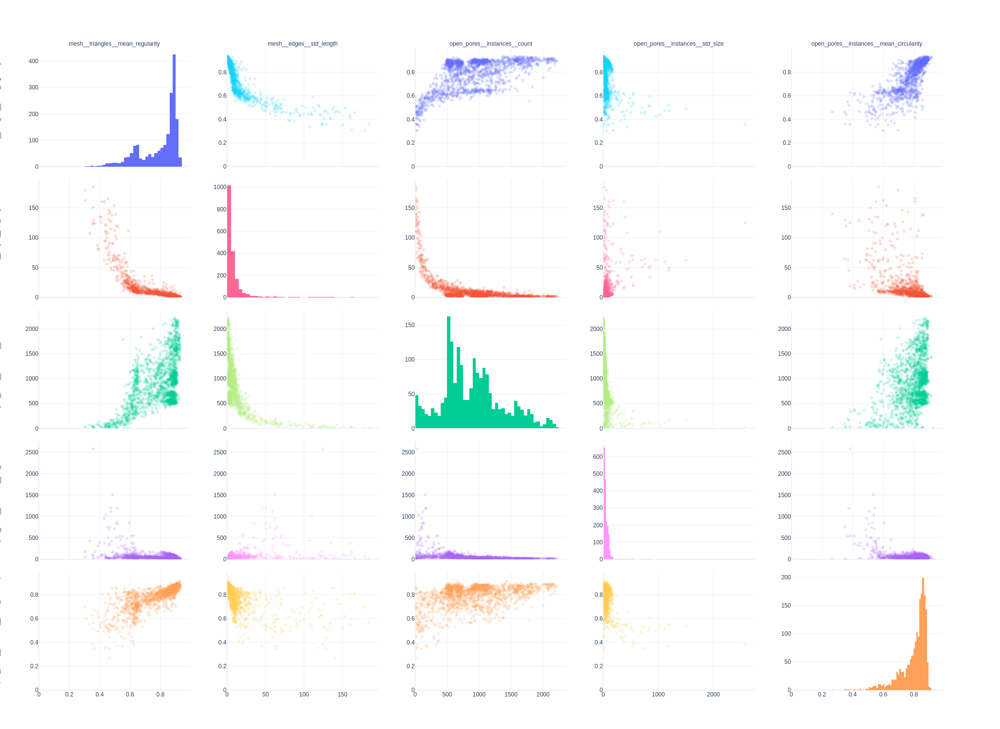

In [82]:
grid_plot(data,props_relation_2,text_size=12,plot_size=300)

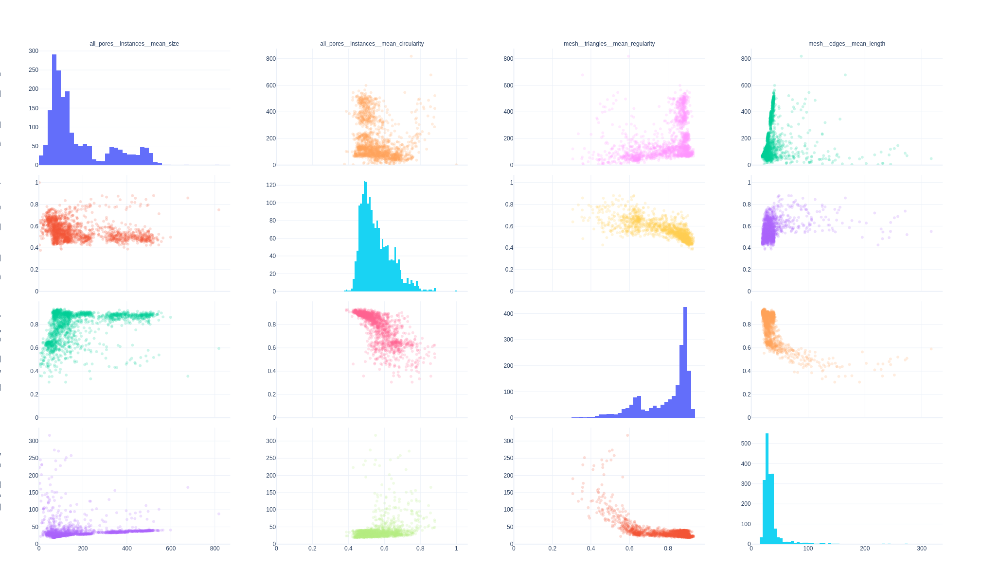

In [122]:

props=["all_pores__instances__mean_size","all_pores__instances__mean_circularity","mesh__triangles__mean_regularity","mesh__edges__mean_length"]
#props_n=["pores_mean_size","pores_mean_circularity","triangles_mean_regularity","edges__mean_length"]
fig = make_subplots(rows=len(props), cols=len(props),shared_xaxes=True,vertical_spacing=0.02,column_titles=props,row_titles=props)
for i,(p1,p2) in enumerate(product(props,props)):
    i_row=i%len(props)+1
    i_col=i//len(props)+1
    if p1==p2:
        fig.add_trace(go.Histogram(histfunc="count", x=data[p1]),row=i_row,col=i_col)
    else:
        fig.add_trace(go.Scatter(x=data[p1],y=data[p2],mode='markers',marker=dict(opacity=0.2)),row=i_row,col=i_col) # hover text goes here
fig.update_layout( height=300*len(props),width=300*len(props),showlegend=False,template="plotly_white")

#fig.for_each_annotation(lambda a: a.update(x = -0.07) if a.text in props else())
for anno in fig['layout']['annotations']:
    anno['font']= {'size': 12}
    if anno['textangle']:
        anno['textangle']=-90
        anno['x']=-0.05
fig.update_xaxes(rangemode="tozero")
fig.update_yaxes(rangemode="tozero")

fig.show()
#fig.update_layout(layout=dict(title="X"),row=1,col=1)
#fig.layout.annotations[1].update(text="Stackoverflow")
#fig.for_each_annotation(lambda a:  a.update(y = -0.2) if a.text in props)
# fig.for_each_annotation(lambda a: a.update(x = -0.07) if a.text in props else())
# for anno in fig['layout']['annotations']:
#     anno['font']= {'size': 12}
#     if anno['textangle']:
#         anno['textangle']=-90#fig.update_layout(layout=dict(title="X"),row=1,col=1)
#fig.layout.annotations[1].update(text="Stackoverflow")
#fig.for_each_annotation(lambda a:  a.update(y = -0.2) if a.text in props)
# fig.for_each_annotation(lambda a: a.update(x = -0.07) if a.text in props else())
# for anno in fig['layout']['annotations']:
#     anno['font']= {'size': 12}
#     if anno['textangle']:
#         anno['textangle']=-90

fig.show()  

In [118]:
fig['layout']

Layout({
    'annotations': [{'font': {'size': 12},
                     'showarrow': False,
                     'text': 'all_pores__instances__mean_size',
                     'x': -0.07,
                     'xanchor': 'center',
                     'xref': 'paper',
                     'y': 0.9999999999999999,
                     'yanchor': 'bottom',
                     'yref': 'paper'},
                    {'font': {'size': 12},
                     'showarrow': False,
                     'text': 'all_pores__instances__mean_circularity',
                     'x': -0.07,
                     'xanchor': 'center',
                     'xref': 'paper',
                     'y': 0.9999999999999999,
                     'yanchor': 'bottom',
                     'yref': 'paper'},
                    {'font': {'size': 12},
                     'showarrow': False,
                     'text': 'mesh__triangles__mean_regularity',
                     'x': -0.07,
                     'xanc

In [99]:
props=["all_pores__instances__mean_size","all_pores__instances__mean_circularity","mesh__triangles__mean_regularity","mesh__edges__mean_length"]

TypeError: can't multiply sequence by non-int of type 'list'

In [107]:
props=["all_pores__instances__mean_size","all_pores__instances__mean_circularity","mesh__triangles__mean_regularity","mesh__edges__mean_length"]
props.insert(1,"").insert(3,"")
props

AttributeError: 'NoneType' object has no attribute 'insert'